In [33]:
import pandas as pd
import numpy as np
import networkx as nx
import scipy.stats as stt

# Import and "corrupt" the original dataframe

In [34]:
folder = "data/post_2024_06_09"
df0 = pd.read_csv("data/post_2024_06_09/all_votes.csv", sep=',')

Import the data correctly (i.e. specifying the separator)

In [35]:
# Visualize the dataframe
df0

,member.id,member.first_name,member.last_name,member.country.code,member.country.label,member.country.iso_alpha_2,member.group.code,member.group.label,member.group.short_label,169362,...,178484,178500,178702,178731,178767,178788,178875,178979,178988,179048
0,840,Charles,GOERENS,LUX,Luxembourg,LU,RENEW,Renew Europe,Renew,FOR,...,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR
1,1294,Elio,DI RUPO,BEL,Belgium,BE,SD,Progressive Alliance of Socialists and Democrats,S&D,FOR,...,FOR,FOR,FOR,FOR,ABSTENTION,FOR,AGAINST,FOR,FOR,AGAINST
2,1909,Bernd,LANGE,DEU,Germany,DE,SD,Progressive Alliance of Socialists and Democrats,S&D,FOR,...,FOR,DID_NOT_VOTE,FOR,FOR,AGAINST,FOR,AGAINST,FOR,FOR,FOR
3,1917,Markus,FERBER,DEU,Germany,DE,EPP,European Peopleâs Party,EPP,FOR,...,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,AGAINST
4,1927,Peter,LIESE,DEU,Germany,DE,EPP,European Peopleâs Party,EPP,FOR,...,FOR,FOR,FOR,FOR,FOR,FOR,DID_NOT_VOTE,FOR,FOR,DID_NOT_VOTE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,261796,SÃ©verine,WERBROUCK,FRA,France,FR,PFE,Patriots for Europe,Patriots for Europe,NaN,...,FOR,ABSTENTION,FOR,AGAINST,FOR,ABSTENTION,FOR,FOR,FOR,ABSTENTION
727,261797,Christophe,BAY,FRA,France,FR,PFE,Patriots for Europe,Patriots for Europe,NaN,...,FOR,ABSTENTION,FOR,AGAINST,FOR,ABSTENTION,FOR,FOR,FOR,ABSTENTION
728,262021,Hanna,GRONKIEWICZ-WALTZ,POL,Poland,PL,EPP,European Peopleâs Party,EPP,NaN,...,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE
729,267485,Volker,SCHNURRBUSCH,DEU,Germany,DE,ESN,Europe of Sovereign Nations,ESN,NaN,...,AGAINST,AGAINST,AGAINST,AGAINST,AGAINST,AGAINST,FOR,ABSTENTION,FOR,AGAINST


### Select the variables to study

Node variables

In [36]:
# node variables are all calumns that are numbers

list_of_node_variables = [c for c in df0.columns if c.isdigit()]

df_nodes = df0[list_of_node_variables]

In [37]:
df_nodes

,169362,169401,169418,169419,169541,169544,169565,169623,169676,169701,...,178484,178500,178702,178731,178767,178788,178875,178979,178988,179048
0,FOR,FOR,FOR,FOR,FOR,FOR,FOR,DID_NOT_VOTE,FOR,DID_NOT_VOTE,...,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR
1,FOR,FOR,FOR,FOR,AGAINST,FOR,FOR,AGAINST,FOR,FOR,...,FOR,FOR,FOR,FOR,ABSTENTION,FOR,AGAINST,FOR,FOR,AGAINST
2,FOR,FOR,FOR,FOR,ABSTENTION,FOR,FOR,DID_NOT_VOTE,FOR,FOR,...,FOR,DID_NOT_VOTE,FOR,FOR,AGAINST,FOR,AGAINST,FOR,FOR,FOR
3,FOR,FOR,AGAINST,AGAINST,FOR,FOR,FOR,FOR,FOR,FOR,...,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,FOR,AGAINST
4,FOR,FOR,AGAINST,AGAINST,FOR,FOR,FOR,DID_NOT_VOTE,FOR,FOR,...,FOR,FOR,FOR,FOR,FOR,FOR,DID_NOT_VOTE,FOR,FOR,DID_NOT_VOTE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DID_NOT_VOTE,...,FOR,ABSTENTION,FOR,AGAINST,FOR,ABSTENTION,FOR,FOR,FOR,ABSTENTION
727,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DID_NOT_VOTE,...,FOR,ABSTENTION,FOR,AGAINST,FOR,ABSTENTION,FOR,FOR,FOR,ABSTENTION
728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE,DID_NOT_VOTE
729,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,AGAINST,AGAINST,AGAINST,AGAINST,AGAINST,AGAINST,FOR,ABSTENTION,FOR,AGAINST


In [38]:
# heat variables are just "left" and "right"

Heat variables

### Consistency

I.e. make the naming of the responses consistent

In [39]:
df_nodes["169418"].unique()

array(['FOR', 'AGAINST', 'DID_NOT_VOTE', nan, 'ABSTENTION'], dtype=object)

# Make the dummy-coded dataframe

In [40]:
df_dummy = pd.DataFrame()
df = df_nodes.copy() # Select the dataframe of the nodes

list_of_columns = df_nodes.columns # here you can select a subset of columns


for col in list_of_columns: # For each column...
    values = (df[col].unique()) # ... get the list of the possible responses (i.e. nodes)
    
    for value in values: # For each response
        if type(value) == str: # check if the answer is type string
            name = str(col)+":"+str(value) # get the names as col:response
            df_dummy[name] = df[col] == value # get dummy-coded column

        else:
                name = str(col)+":"+str(value) 
                df_dummy[name] = df[col] == value


/var/folders/wd/y6168jtx54j31_3xpbpm3srr0000gn/T/ipykernel_1350/2766754546.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_dummy[name] = df[col] == value # get dummy-coded column
/var/folders/wd/y6168jtx54j31_3xpbpm3srr0000gn/T/ipykernel_1350/2766754546.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_dummy[name] = df[col] == value # get dummy-coded column
/var/folders/wd/y6168jtx54j31_3xpbpm3srr0000gn/T/ipykernel_1350/2766754546.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the resul

In [41]:
df_dummy

,169362:FOR,169362:AGAINST,169362:ABSTENTION,169362:DID_NOT_VOTE,169362:nan,169401:FOR,169401:DID_NOT_VOTE,169401:ABSTENTION,169401:AGAINST,169401:nan,...,178979:AGAINST,178988:FOR,178988:DID_NOT_VOTE,178988:nan,178988:ABSTENTION,179048:FOR,179048:AGAINST,179048:DID_NOT_VOTE,179048:ABSTENTION,179048:nan
0,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,True,False,False,False,False
1,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,True,False,False,False
2,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,True,False,False,False,False
3,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,True,False,False,False
4,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,True,False
727,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,True,False
728,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,True,False,False
729,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,True,False,False,False


# Make the network (complete version)

### Support functions

In [42]:
def phi_(n11,n00,n10,n01):
    n1p = n11+n10
    n0p = n01+n00
    np1 = n01+n11
    np0 = n10+n00
    
    num = n11*n00-n10*n01
    den_ = n1p*n0p*np0*np1
    
    if den_==0:
        phi_=np.nan
    else:
        phi_ = num/np.sqrt(den_)
    return phi_

In [43]:
def p_val(r,L):
    den = np.sqrt(1-r**2)
    deg_free = L-2
    if den==0:
        p = 0
    else:
        num = r*np.sqrt(deg_free)
        t = num/den
        p = stt.t.sf(abs(t), df=deg_free)*2
    return p

In [44]:
def phi(x,y,get_p=False):
    
    m_eq = x==y
    m_diff = np.logical_not(m_eq)
    
    n11 = float(np.sum(x[m_eq]==True))
    n00 = float(np.sum(x[m_eq]==False))
    
    n10 = float(np.sum(x[m_diff]==True))
    n01 = float(np.sum(y[m_diff]==True))
    
    phi_val = phi_(n11,n00,n10,n01)
    
    if get_p:
        p = p_val(phi_val,len(x))
        return phi_val, p
    else:
        return phi_val

### Main function

In [45]:
def make_graph_(df, list_of_nodes, alpha=0.05, get_p=True, remove_nan=False, remove_non_significant=False, exclude_same_question=True, print_=False):
    
    if get_p==False and remove_non_significant==True:
        print("Warning: Setting remove_non_significant to False as get_p is False!")
        remove_non_significant=False
    
    G = nx.Graph()
    
    count = 0
    # only select 30 nodes
    list_of_nodes = list_of_nodes # here you could select a subset of the nodes
    for i, node_i in enumerate(list_of_nodes):
        for j, node_j in enumerate(list_of_nodes):
            
            if j <= i: # do not run the same couple twice
                continue
            
            if print_:
                count += 1
                l = len(list_of_nodes)
                n_tot = l*(l-1)/2
                print(count,"/",n_tot, " = ", np.round(count/n_tot,decimals=2)*100, '%')
                
            basename1 = node_i.split(sep=':')[0]
            basename2 = node_j.split(sep=':')[0]
            
            if exclude_same_question:
                if basename1 == basename2: # if they belong to the same item
                    continue

            # Get the two columns
            c1 = df[node_i]
            c2 = df[node_j]
            
            if remove_nan:
                if ("Ref" in node_i) or ("Ref" in node_j):
                    continue
                
                c1_n = df[basename1+":nan"] # get the refused values of each item
                c2_n = df[basename2+":nan"]
                
                mask = np.logical_not(np.logical_or(c1_n, c2_n)) # get a mask of the refused values
                
                c1 = c1[mask] # select only the non-nan element
                c2 = c2[mask]
            
            if get_p:
                (r,p) = phi(c1,c2, get_p=True)
            else:
                r = phi(c1,c2, get_p=False)
            
            # Check if there are the conditions for drawing a node
            if remove_non_significant: 
                condition = r>0 and p<alpha
            else:
                condition = r>0

            if condition:
                G.add_weighted_edges_from([(node_i,node_j,r)],weight='weight')
                if get_p:
                    G.add_weighted_edges_from([(node_i,node_j,p)],weight='p')
                    sig = float(p<alpha) # Boolean are not accepted as edge weight
                    G.add_weighted_edges_from([(node_i,node_j,sig)],weight='sig')
    return G

### Make the network from the dummy-coded dataframe

In [46]:
# Parameters
remove_nan=False
get_p=True
remove_non_significant=False
alpha=0.05

# get graph without the did not vote
valid_suffixes = (':FOR', ':AGAINST', ':ABSTENTION')
filtered_cols = [col for col in df_dummy.columns if col.endswith(valid_suffixes)]
df_dummy = df_dummy[filtered_cols]


# Get the graph
G = make_graph_(df=df_dummy, list_of_nodes=df_dummy.columns, alpha=alpha, get_p=get_p, remove_non_significant=remove_non_significant, 
                remove_nan=remove_nan, exclude_same_question=False, print_=True)
print("Complete!")

1 / 253116.0  =  0.0 %
2 / 253116.0  =  0.0 %
3 / 253116.0  =  0.0 %
4 / 253116.0  =  0.0 %
5 / 253116.0  =  0.0 %
6 / 253116.0  =  0.0 %
7 / 253116.0  =  0.0 %
8 / 253116.0  =  0.0 %
9 / 253116.0  =  0.0 %
10 / 253116.0  =  0.0 %
11 / 253116.0  =  0.0 %
12 / 253116.0  =  0.0 %
13 / 253116.0  =  0.0 %
14 / 253116.0  =  0.0 %
15 / 253116.0  =  0.0 %
16 / 253116.0  =  0.0 %
17 / 253116.0  =  0.0 %
18 / 253116.0  =  0.0 %
19 / 253116.0  =  0.0 %
20 / 253116.0  =  0.0 %
21 / 253116.0  =  0.0 %
22 / 253116.0  =  0.0 %
23 / 253116.0  =  0.0 %
24 / 253116.0  =  0.0 %
25 / 253116.0  =  0.0 %
26 / 253116.0  =  0.0 %
27 / 253116.0  =  0.0 %
28 / 253116.0  =  0.0 %
29 / 253116.0  =  0.0 %
30 / 253116.0  =  0.0 %
31 / 253116.0  =  0.0 %
32 / 253116.0  =  0.0 %
33 / 253116.0  =  0.0 %
34 / 253116.0  =  0.0 %
35 / 253116.0  =  0.0 %
36 / 253116.0  =  0.0 %
37 / 253116.0  =  0.0 %
38 / 253116.0  =  0.0 %
39 / 253116.0  =  0.0 %
40 / 253116.0  =  0.0 %
41 / 253116.0  =  0.0 %
42 / 253116.0  =  0.0 %
4

Save

In [ ]:
# filename = 'EP_with_same_question'
# nx.write_gexf(G,filename+'.gexf')

# Make heatmap

Make the heatmap using the average

                   ThermoRep
169362:FOR         -0.229601
169362:AGAINST      0.263208
169362:ABSTENTION  -0.042740
169401:FOR          0.001543
169401:ABSTENTION  -0.092792


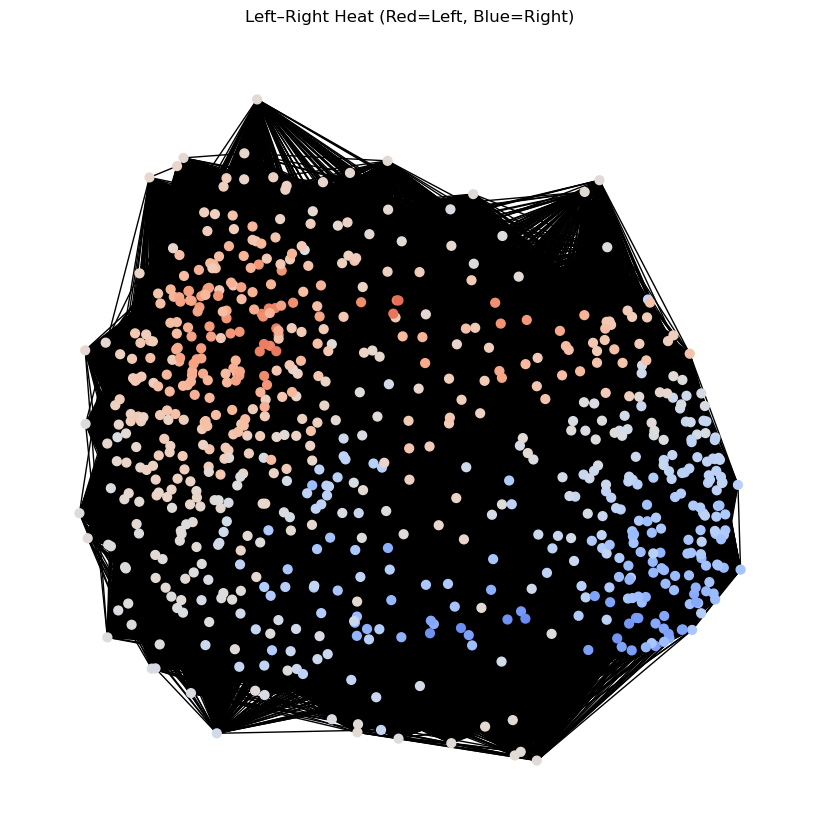

In [48]:
# =====================================================
#  LEFT–RIGHT heat per node using correlation (ResIN style)
# =====================================================

import pandas as pd
import numpy as np
import networkx as nx
from scipy import stats as stt

# 1️⃣  Detect the party/group column in df0
party_candidates = [
    "member.group.short_label", "member.group.label", "member.group.code",
    "party_family", "party", "group_short", "group_label", "group_code",
]
party_col = next((c for c in party_candidates if c in df0.columns), None)
assert party_col is not None, "❌ No party/group column found in df0."

# 2️⃣  Define ideology scores (−1 = left ... +1 = right)
party_axis = {
    "GUE/NGL": -1.0, "The Left": -1.0,
    "Greens/EFA": -0.8, "Greens/European Free Alliance": -0.8,
    "S&D": -0.6, "SD": -0.6,
    "Renew": -0.2, "RENEW": -0.2, "Renew Europe": -0.2,
    "EPP": 0.4, "European People’s Party": 0.4, "European People\u2019s Party": 0.4,
    "ECR": 0.7, "European Conservatives and Reformists": 0.7,
    "PFE": 0.9, "Patriots for Europe": 0.9,
    "ESN": 0.8, "Europe of Sovereign Nations": 0.8,
    "ID": 1.0, "Identity & Democracy": 1.0,
    "NI": 0.0, "Non-attached": 0.0,
}

# 3️⃣  Align df0 with df_dummy (same MEP order)
if df0.index.name == df_dummy.index.name and df0.index.isin(df_dummy.index).any():
    mep_party = df0[party_col]
elif "mep_id" in df0.columns and df_dummy.index.name == "mep_id":
    mep_party = df0.set_index("mep_id")[party_col]
else:
    mep_party = df0[party_col]

common_ids = df_dummy.index.intersection(mep_party.index)
X = df_dummy.loc[common_ids].fillna(False).astype(bool)
parties = mep_party.loc[common_ids].astype(str)

# 4️⃣  Build MEP-level heat vector (ideology score per MEP)
mep_heat = parties.map(party_axis).astype(float)
mep_heat = mep_heat.where(~mep_heat.isna(), 0.0)  # treat unknown as neutral (0.0)

# 5️⃣  Define correlation helper (ignore NaNs)
def corr_nan(x, y):
    """Compute Pearson r, ignoring NaN values."""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = ~np.isnan(x) & ~np.isnan(y)
    if mask.sum() < 3:
        return (0.0, 1.0)
    r, p = stt.pearsonr(x[mask], y[mask])
    return (r, p)

# 6️⃣  Compute correlation of each node’s endorsement pattern with ideology
dic_r = {}
type_ = "standard"  # "standard" for real r, "sign" for ±1 only

for node in X.columns:
    col_node = X[node].astype(float)  # 0/1 per MEP
    r, p = corr_nan(col_node, mep_heat)
    dic_r[node] = np.sign(r) if type_ == "sign" else r

# 7️⃣  Attach as node attribute in your network
nx.set_node_attributes(G, dic_r, "ThermoRep_mean")

# 8️⃣  Optional: inspect or save
df_heat = pd.DataFrame.from_dict(dic_r, orient="index", columns=["ThermoRep"])
print(df_heat.head())

# # 9️⃣  Optional: visualize (red = left, blue = right)
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

norm = mcolors.Normalize(vmin=-1, vmax=1)
cmap = plt.cm.coolwarm
colors = [cmap(norm(df_heat.loc[n, "ThermoRep"])) if n in df_heat.index else (0.8, 0.8, 0.8) for n in G.nodes()]

plt.figure(figsize=(8, 8))
nx.draw(G, node_color=colors, node_size=40, with_labels=False)
plt.title("Left–Right Heat (Red=Left, Blue=Right)")
plt.axis("off")
plt.show()

In [49]:
filename = 'EP_final_same_question'
nx.write_gexf(G,filename+'.gexf')

In [ ]:
df_dummy

,169362:FOR,169362:AGAINST,169362:ABSTENTION,169362:DID_NOT_VOTE,169362:nan,169401:FOR,169401:DID_NOT_VOTE,169401:ABSTENTION,169401:AGAINST,169401:nan,...,178979:AGAINST,178988:FOR,178988:DID_NOT_VOTE,178988:nan,178988:ABSTENTION,179048:FOR,179048:AGAINST,179048:DID_NOT_VOTE,179048:ABSTENTION,179048:nan
0,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,True,False,False,False,False
1,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,True,False,False,False
2,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,True,False,False,False,False
3,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,True,False,False,False
4,True,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,True,False
727,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,True,False
728,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,True,False,False
729,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,True,False,False,False


### Manually exploring the network

In [50]:
node1 = "169362:AGAINST"
node2 = "169362:FOR"
G.get_edge_data(node1,node2) # this function is not working

### Finding the x and y component of the nodes

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [ ]:
pos = nx.spring_layout(G,iterations=5000) # Get the positions with the spring layout

# Restructure the data type
pos2 = [[],[]]
key_list = [] # ordered list of the nodes
for key in pos:
    pos2[0].append(pos[key][0])
    pos2[1].append(pos[key][1])
    key_list.append(key)

# Use PCA to rotate the network in such a way that the x-axis is the main one
pos3 = []
for key in pos:
    pos3.append([pos[key][0],pos[key][1]])

pca = PCA(n_components=2)
pca.fit(pos3)
x_pca = pca.transform(pos3)

# Get the x and y position of each node
xx = x_pca[:,0]
yy = x_pca[:,1]

Correlation between x coordinate and feeling thermometer

In [ ]:
dict_term = nx.get_node_attributes(G,"ThermoRep_mean") # get the feeling thermo
thermo = [dict_term[key] for key in key_list]
stt.spearmanr(xx,thermo)

SignificanceResult(statistic=-0.3066807313642757, pvalue=0.005659656957692213)

# Quantitative analysis of clusters

In [ ]:
clust1 = ["environment:More_regul++",
"environment:More_regul+",
"abortion:always",
"income:favor",
"immigrants:Allow",
"welfare:increased",
"gay:can_marry",
"gun:More_diffic",
"black:Help++",
"black:Help+"]

clust2 = ["welfare:decreased",
'abortion:spec.Cases',
'income:neither',
'income:oppose',
'immigrants:sendBack',
'immigrants:GuestProgram',
'gay:no_recognition',
'gay:civ.union',
'environment:Less_regul++',
'environment:neut',
'environment:Less_regul',
'environment:Less_regul+',
'gun:Same',
'gun:Easier',
'black:NoHelp++',
'black:NoHelp+',
'black:NoHelp',
'abortion:Never',
'abortion:in_Need']


In [ ]:
def get_mean_corr(df_,cl):
    corrs = []
    for i1, el1 in enumerate(cl):
        for i2, el2 in enumerate(cl):
            if i1>i2:
                line1 = df_[el1]
                line2 = df_[el2]
                r = phi(line1,line2, get_p=False)
                corrs.append(r)
    return np.mean(corrs)

In [ ]:
print("Coherence clust 1: ", get_mean_corr(df_dummy, clust1))
print("Coherence clust 2: ", get_mean_corr(df_dummy, clust2))

KeyError: 'environment:More_regul+'

### Bootstrap it!

In [ ]:
N_rep = 100

M1 = []
M2 = []

df_len = len(df_dummy)

for i in range(N_rep):
    
    index_t = (np.random.rand(df_len)*(df_len-1)).astype(int) # generate the list
    
    df_t = df_dummy.iloc[index_t]
    
    m1 = get_mean_corr(df_t, clust1)
    m2 = get_mean_corr(df_t, clust2)
    
    M1.append(m1)
    M2.append(m2)

In [ ]:
# Print the 10-90 % interval
print("Clust1: ", np.round(np.percentile(M1,10),3), "-", np.round(np.percentile(M1,90),3))
print("Clust2: ", np.round(np.percentile(M2,10),3), "-", np.round(np.percentile(M2,90),3))

Clust1:  0.203 - 0.211
Clust2:  0.069 - 0.072


In [ ]:
tests = np.array(M1)>np.array(M2)
np.sum(tests)/len(tests)

1.0

In [ ]:
tests = np.array(M1)<=np.array(M2)
np.sum(tests)/len(tests)

0.0

In [32]:
# Analyze the weights of the edges
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def analyze_edge_weights(G, title="Network"):
    edges = []
    for u, v, data in G.edges(data=True):
        w = data.get("weight", None)
        if w is not None and np.isfinite(w):
            edges.append((u, v, float(w)))
    if not edges:
        print(f"[{title}] No finite 'weight' attributes found on edges.")
        return None

    dfw = pd.DataFrame(edges, columns=["u", "v", "weight"])

    # Summary
    desc = dfw["weight"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])
    print(f"\n[{title}] Edge weight summary:")
    print(desc.to_string())

    # Top/bottom edges
    top_n = 10
    print(f"\n[{title}] Top {top_n} edges by weight:")
    print(dfw.sort_values("weight", ascending=False).head(top_n).to_string(index=False))

    print(f"\n[{title}] Bottom {top_n} edges by weight:")
    print(dfw.sort_values("weight", ascending=True).head(top_n).to_string(index=False))

    # Histogram
    plt.figure(figsize=(8, 4))
    plt.hist(dfw["weight"], bins=50, color="#1f77b4", alpha=0.75, edgecolor="white")
    plt.title(f"{title} - Edge Weight Distribution")
    plt.xlabel("weight")
    plt.ylabel("count")
    plt.tight_layout()
    plt.show()

    # If similarities in [0,1], zoom in high range
    if dfw["weight"].min() >= 0 and dfw["weight"].max() <= 1:
        plt.figure(figsize=(8, 4))
        plt.hist(dfw["weight"], bins=np.linspace(0.7, 1.0, 31), color="#ff7f0e", alpha=0.75, edgecolor="white")
        plt.title(f"{title} - Edge Weights (zoom 0.7–1.0)")
        plt.xlabel("weight")
        plt.ylabel("count")
        plt.tight_layout()
        plt.show()

    # Node-level average incident weight
    avg_w_by_node = {}
    for n in G.nodes():
        ws = []
        for _, nbr, data in G.edges(n, data=True):
            w = data.get("weight", None)
            if w is not None and np.isfinite(w):
                ws.append(float(w))
        avg_w_by_node[n] = np.mean(ws) if ws else np.nan
    avg_w_series = pd.Series(avg_w_by_node, name="avg_incident_weight").dropna()

    print(f"\n[{title}] Node-level avg incident weight:")
    print(avg_w_series.describe().to_string())

    return dfw

df_edge_weights_G = analyze_edge_weights(G, title="Full network")


NameError: name 'G' is not defined